# Set-Up

In [1]:
# Install Requirements

!pip install -r requirements.txt

In [1]:
# Import packages
import os
import math
import json
import collections
import requests
import pandas as pd
import numpy as np
import rasterio
from rasterio.warp import transform_bounds
from rasterio.shutil import copy as rio_copy
from rasterio.features import shapes
import xml.etree.ElementTree as ET
from shapely.geometry import box, shape
from shapely.ops import unary_union, transform as shp_transform
from shapely import wkt as shp_wkt
from shapely.geometry import box as shp_box
from pyproj import Transformer
from urllib.parse import quote
import matplotlib.pyplot as plt
from glob import glob
from rasterio.warp import transform_bounds
from rasterio.merge import merge

# Collocation

In [ ]:
# =========================
# Auth + basic HTTP
# =========================
def get_access_and_refresh_token(username, password):
    url = "https://identity.dataspace.copernicus.eu/auth/realms/CDSE/protocol/openid-connect/token"
    data = {
        "grant_type": "password",
        "username": username,
        "password": password,
        "client_id": "cdse-public",
    }
    r = requests.post(url, data=data)
    r.raise_for_status()
    js = r.json()
    return js["access_token"], js["refresh_token"]

def refresh_access_token(refresh_token):
    url = "https://identity.dataspace.copernicus.eu/auth/realms/CDSE/protocol/openid-connect/token"
    data = {
        "grant_type": "refresh_token",
        "refresh_token": refresh_token,
        "client_id": "cdse-public",
    }
    r = requests.post(url, data=data, headers={"Content-Type": "application/x-www-form-urlencoded"})
    r.raise_for_status()
    return r.json()["access_token"]

def make_api_request(url, method="GET", data=None, headers=None):
    # minimal retry on 401/403 using global tokens
    global access_token, refresh_token
    if not headers:
        headers = {"Authorization": f"Bearer {access_token}"}
    resp = requests.request(method, url, json=data, headers=headers)
    if resp.status_code in (401, 403):
        access_token = refresh_access_token(refresh_token)
        headers["Authorization"] = f"Bearer {access_token}"
        resp = requests.request(method, url, json=data, headers=headers)
    return resp

# =========================
# Geometry helpers (LiDAR bounds -> WKT)
# =========================
def get_combined_bounds(tif_dir):
    geoms = []
    for fname in os.listdir(tif_dir):
        if fname.lower().endswith(".tif"):
            with rasterio.open(os.path.join(tif_dir, fname)) as src:
                b = transform_bounds(src.crs, "EPSG:4326", *src.bounds)
                geoms.append(box(*b))
    return unary_union(geoms)

def bounds_to_wkt(bounds_geom):
    return bounds_geom.wkt


# =========================
# Catalogue query (with cloudCover)
# =========================
def query_sentinel2_for_tif_area(start_date, end_date, token, wkt_polygon, min_cloud=0, max_cloud=20):
    all_rows = []
    filter_string = (
        f"Collection/Name eq 'SENTINEL-2' and "
        f"Attributes/OData.CSC.StringAttribute/any(att:att/Name eq 'productType' and att/Value eq 'S2MSI2A') and "
        f"Attributes/OData.CSC.DoubleAttribute/any(att:att/Name eq 'cloudCover' and att/Value ge {min_cloud}) and "
        f"Attributes/OData.CSC.DoubleAttribute/any(att:att/Name eq 'cloudCover' and att/Value le {max_cloud}) and "
        f"ContentDate/Start gt {start_date}T00:00:00.000Z and ContentDate/Start lt {end_date}T23:59:59.999Z"
    )

    next_url = (
        "https://catalogue.dataspace.copernicus.eu/odata/v1/Products?"
        f"$filter={filter_string} and OData.CSC.Intersects(area=geography'SRID=4326;{wkt_polygon}')"
        "&$top=100&$expand=Attributes"
    )
    headers = {"Authorization": f"Bearer {token}"}

    while next_url:
        r = make_api_request(next_url, headers=headers)
        r.raise_for_status()
        js = r.json()
        all_rows.extend(js.get("value", []))
        next_url = js.get("@odata.nextLink")

    return pd.DataFrame(all_rows)

# =========================
# Format results (+ cloud cover column)
# =========================
def format_sentinel2_results(df_raw):
    out = []
    for _, row in df_raw.iterrows():
        cloud_cover = None
        for att in row.get("Attributes", []):
            if att.get("Name") == "cloudCover":
                cloud_cover = att.get("Value")
                break

        cd = row.get("ContentDate", {})
        name = row.get("Name", "")
        out.append({
            "ProductID": row["Id"],
            "ProductName": name,
            "AcquisitionDate": cd.get("Start", "")[:10],
            "Tile": name.split("_")[5] if "_" in name else "Unknown",
            "Size (MB)": round(int(row["ContentLength"]) / 1e6, 2),
            "DownloadPath": row.get("S3Path"),
            "FootprintWKT": row.get("Footprint"),
            "CloudCover": cloud_cover,
            "SunZenithMean": None,
            "SunAzimuthMean": None,
            "ViewZenithMean": None,
            "ViewAzimuthMean": None,
        })
    return pd.DataFrame(out)


# =========================
# Nodes traversal (simple + robust)
# =========================
def _nodes_array(js):
    # CDSE may return 'result' or 'value'
    if isinstance(js, dict):
        if isinstance(js.get("result"), list):
            return js["result"]
        if isinstance(js.get("value"), list):
            return js["value"]
    return []

def list_nodes(product_id, headers, uri=None, node_id=None):
    if uri:
        url = uri
    else:
        base = f"https://download.dataspace.copernicus.eu/odata/v1/Products({product_id})"
        url = f"{base}/Nodes" if node_id is None else f"{base}/Nodes({node_id})/Nodes"
    r = make_api_request(url, headers=headers)
    r.raise_for_status()
    return _nodes_array(r.json())

def find_tile_metadata_download_url(product_id, headers, max_nodes=3000):
    """
    BFS following each folder's Nodes.uri; when we see a file named 'MTD_TL*.xml',
    return a direct $value URL. Minimal checks, prioritized GRANULE path.
    """
    roots = list_nodes(product_id, headers=headers)  # /Products(pid)/Nodes
    if not roots:
        return None

    top_nodes_uri = f"https://download.dataspace.copernicus.eu/odata/v1/Products({product_id})/Nodes"
    q = collections.deque((n, top_nodes_uri) for n in roots)
    visited = 0

    while q and visited < max_nodes:
        node, parent_nodes_uri = q.popleft()
        visited += 1

        name = (node.get("Name") or "").strip()
        children_num = node.get("ChildrenNumber", 0)
        nodes_uri = (node.get("Nodes") or {}).get("uri")

        # File: check for tile metadata
        if children_num == 0 and name.upper().startswith("MTD_TL") and name.lower().endswith(".xml"):
            # parent_nodes_uri ends with .../Nodes, append (file)/$value
            return f"{parent_nodes_uri}({quote(name, safe='-._~')})/$value"

        # Folder: enqueue children; explore GRANULE first
        if children_num > 0 and nodes_uri:
            kids = list_nodes(product_id, headers=headers, uri=nodes_uri)
            kids.sort(key=lambda k: (k.get("ChildrenNumber", 0) == 0, k.get("Name") != "GRANULE", k.get("Name","")))
            for ch in kids:
                q.append((ch, nodes_uri))

    return None


# =========================
# XML parsing (angles)
# =========================
def _to_float(x):
    try:
        return float(x)
    except Exception:
        return None

def parse_angles_from_tile_xml(xml_bytes):
    root = ET.fromstring(xml_bytes)

    # Sun mean angles: Tile_Angles/Mean_Sun_Angle/{ZENITH_ANGLE, AZIMUTH_ANGLE}
    sun_zen = _to_float(root.findtext(".//{*}Tile_Angles/{*}Mean_Sun_Angle/{*}ZENITH_ANGLE"))
    sun_azi = _to_float(root.findtext(".//{*}Tile_Angles/{*}Mean_Sun_Angle/{*}AZIMUTH_ANGLE"))

    # Viewing incidence angles (per band/detector) -> average
    vzen, vazi = [], []
    for vi in root.findall(".//{*}Mean_Viewing_Incidence_Angle"):
        z = _to_float((vi.findtext(".//{*}ZENITH_ANGLE")))
        a = _to_float((vi.findtext(".//{*}AZIMUTH_ANGLE")))
        if z is not None: vzen.append(z)
        if a is not None: vazi.append(a)

    view_zen = float(np.mean(vzen)) if vzen else None
    view_azi = float(np.mean(vazi)) if vazi else None

    return {
        "SunZenithMean": sun_zen,
        "SunAzimuthMean": sun_azi,
        "ViewZenithMean": view_zen,
        "ViewAzimuthMean": view_azi,
    }


# =========================
# Enricher (fills angle columns)
# =========================
def enrich_with_angles(df, token, print_first_url=True):
    headers = {"Authorization": f"Bearer {token}"}
    first_url_printed = False

    for i, row in df.iterrows():
        pid = row["ProductID"]
        xml_url = find_tile_metadata_download_url(pid, headers=headers)
        if not xml_url:
            print(f"[angles] No MTD_TL*.xml found for {pid}")
            continue

        r = make_api_request(xml_url, headers=headers)
        r.raise_for_status()
        ang = parse_angles_from_tile_xml(r.content)
        for k, v in ang.items():
            df.at[i, k] = v

    return df


# =========================
# EXECUTION
# =========================
if __name__ == "__main__":
    # --- user-provided creds ---
    # set these in your environment or directly here
    username = "ucabtc8@ucl.ac.uk"
    password = "Grandcanyon48!"

    # --- your LiDAR tif directory ---
    tif_path = "/cs/student/projects2/aisd/2024/tcannon/dissertation/data/tifs"

    # 1) bounds -> WKT
    bounds_geom = get_combined_bounds(tif_path)
    wkt_poly = bounds_to_wkt(bounds_geom)

    # 2) date range
    start_date = "2024-04-22"
    end_date   = "2024-04-30"

    # 3) tokens
    access_token, refresh_token = get_access_and_refresh_token(username, password)

    # 4) query catalogue
    df_raw = query_sentinel2_for_tif_area(
        start_date=start_date,
        end_date=end_date,
        token=access_token,
        wkt_polygon=wkt_poly,
        min_cloud=0,
        max_cloud=100
    )

    # 5) format + cloud cover
    df_results = format_sentinel2_results(df_raw)

    # 6) solar + viewing angles (prints the first XML URL)
    df_results = enrich_with_angles(df_results, access_token, print_first_url=True)

    # 7) show results
    pd.set_option("display.max_columns", None)
    df_results.head()


In [3]:
# Display Results

df_results

,ProductID,ProductName,AcquisitionDate,Tile,Size (MB),DownloadPath,FootprintWKT,CloudCover,SunZenithMean,SunAzimuthMean,ViewZenithMean,ViewAzimuthMean
0,0290ae9f-6c1c-45b1-a6f7-16b7f686a277,S2B_MSIL2A_20240424T172859_N0510_R055_T18XVF_2...,2024-04-24,T18XVF,796.72,/eodata/Sentinel-2/MSI/L2A/2024/04/24/S2B_MSIL...,geography'SRID=4326;POLYGON ((-78.061997316705...,90.709317,59.469681,188.449983,3.469552,252.785734
1,04d539a2-fb0d-435e-bda6-4d2799a05730,S2B_MSIL2A_20240430T174909_N0510_R141_T17XNA_2...,2024-04-30,T17XNA,863.48,/eodata/Sentinel-2/MSI/L2A/2024/04/30/S2B_MSIL...,geography'SRID=4326;POLYGON ((-77.768463395767...,72.013462,57.692916,191.086004,7.05439,303.403657
2,ecafe01f-b5f3-4f2b-be6b-8de9face99ca,S2B_MSIL2A_20240427T173859_N0510_R098_T17XPA_2...,2024-04-27,T17XPA,714.12,/eodata/Sentinel-2/MSI/L2A/2024/04/27/S2B_MSIL...,geography'SRID=4326;POLYGON ((-74.742899689455...,97.055525,58.593686,191.420322,7.932704,304.391652
3,ce6d74f8-52b3-4a96-8041-05ca78a003a0,S2B_MSIL2A_20240424T172859_N0510_R055_T17XPA_2...,2024-04-24,T17XPA,798.36,/eodata/Sentinel-2/MSI/L2A/2024/04/24/S2B_MSIL...,geography'SRID=4326;POLYGON ((-77.939224763660...,91.049397,59.419388,188.402984,3.54286,252.296787
4,d41ef5ec-e74a-4be8-a5d6-1cd5cdc3efe5,S2A_MSIL2A_20240422T173911_N0510_R098_T17XPA_2...,2024-04-22,T17XPA,896.97,/eodata/Sentinel-2/MSI/L2A/2024/04/22/S2A_MSIL...,geography'SRID=4326;POLYGON ((-74.739356958840...,47.642237,60.198098,191.087011,7.945808,305.275776
5,bb3d698c-0974-4e68-bf14-53540f8253d2,S2A_MSIL2A_20240425T174911_N0510_R141_T17XPA_2...,2024-04-25,T17XPA,195.68,/eodata/Sentinel-2/MSI/L2A/2024/04/25/S2A_MSIL...,geography'SRID=4326;POLYGON ((-76.153100308740...,92.555821,59.38797,194.108598,10.482137,309.3131
6,a1d15623-0bba-4394-8961-7e77e20e8de9,S2A_MSIL2A_20240429T172901_N0510_R055_T18XVF_2...,2024-04-29,T18XVF,881.90,/eodata/Sentinel-2/MSI/L2A/2024/04/29/S2A_MSIL...,geography'SRID=4326;POLYGON ((-78.061997316705...,78.371137,57.899006,188.769632,3.453953,253.124868
7,094e96d3-0d98-4fbe-9d3c-d6c97fcc3f56,S2A_MSIL2A_20240422T173911_N0510_R098_T18XVF_2...,2024-04-22,T18XVF,913.83,/eodata/Sentinel-2/MSI/L2A/2024/04/22/S2A_MSIL...,geography'SRID=4326;POLYGON ((-74.709011037419...,33.121547,60.248635,191.132586,7.867878,305.304658
8,ec4fe1c2-ab29-4370-80d4-e86db9bcd5f0,S2A_MSIL2A_20240426T171901_N0510_R012_T18XVF_2...,2024-04-26,T18XVF,957.04,/eodata/Sentinel-2/MSI/L2A/2024/04/26/S2A_MSIL...,geography'SRID=4326;POLYGON ((-78.061997316705...,80.317020,58.739096,185.765154,3.920661,128.764261
9,3534328a-c9e5-44e5-b027-ea8502f4d98c,S2B_MSIL2A_20240427T173859_N0510_R098_T17XNA_2...,2024-04-27,T17XNA,760.68,/eodata/Sentinel-2/MSI/L2A/2024/04/27/S2B_MSIL...,geography'SRID=4326;POLYGON ((-81.000612713072...,97.178340,58.489529,188.074587,2.940561,224.268806


In [ ]:
# ---------- 1) LiDAR BBOX in WGS84 (EPSG:4326) ----------

def lidar_bbox_polygon(tif_dir):
    boxes = []
    for fname in os.listdir(tif_dir):
        if not fname.lower().endswith(".tif"):
            continue
        fp = os.path.join(tif_dir, fname)
        with rasterio.open(fp) as ds:
            # densify to handle curved edges during reprojection
            b = transform_bounds(ds.crs, "EPSG:4326", *ds.bounds, densify_pts=21)
            boxes.append(shp_box(*b))
    if not boxes:
        raise RuntimeError("No TIFFs found for bbox computation.")
    return unary_union(boxes).buffer(0)

tif_dir = "/cs/student/projects2/aisd/2024/tcannon/dissertation/data/tifs"
bbox_ll = lidar_bbox_polygon(tif_dir)       # WGS84 polygon
if bbox_ll.is_empty:
    raise RuntimeError("LiDAR bbox is empty.")

# Equal-area transform for area ratios (world cyl. equal area)
to_eq = Transformer.from_crs("EPSG:4326", "EPSG:6933", always_xy=True)
bbox_eq = shp_transform(lambda x, y: to_eq.transform(x, y), bbox_ll)
bbox_area = bbox_eq.area

# ---------- 2) Robust OData footprint parser ----------
def parse_footprint_ll(row):
    """
    Returns a Shapely geometry in WGS84 lon/lat.
    Accepts your df column 'FootprintWKT' (from format step),
    or falls back to 'Footprint'/'GeoFootprint' if present.
    Handles SRID=...; and geography'...'.
    """
    w = row.get("FootprintWKT") or row.get("Footprint") or row.get("GeoFootprint")
    if not w:
        return None
    if isinstance(w, str):
        s = w.strip()
        # Strip geography'...'
        if s.lower().startswith("geography"):
            first = s.find("'")
            last  = s.rfind("'")
            if first != -1 and last != -1 and last > first:
                s = s[first+1:last]
        # Strip SRID=xxxx; prefix if present
        if s.upper().startswith("SRID="):
            s = s.split(";", 1)[-1].strip()
        try:
            g = shp_wkt.loads(s)
            if not g.is_valid:
                g = g.buffer(0)
            return g if not g.is_empty else None
        except Exception:
            return None
    # If it were a dict/GeoJSON (rare in this path) you could handle here.
    return None

# ---------- 3) Coverage checks ----------
def area_fraction_cover(prod_ll, bbox_ll, to_eq):
    prod_eq = shp_transform(lambda x, y: to_eq.transform(x, y), prod_ll)
    inter = prod_eq.intersection(bbox_eq).area
    den = bbox_eq.area if bbox_eq.area > 0 else 1.0
    return float(inter / den)

def product_covers_bbox(prod_ll, bbox_ll, tol=1e-9):
    # Strict topological covers (tolerant to tiny slivers with buffer(0))
    g = prod_ll.buffer(0)
    b = bbox_ll.buffer(0)
    return g.covers(b)

def coverage(prod_ll):
    # 1) try as-is
    frac = area_fraction_cover(prod_ll, bbox_ll, to_eq)
    covers = product_covers_bbox(prod_ll, bbox_ll)
    return frac, covers, False

# ---------- 4) Compute per-product coverage ----------
cov_frac_list, covers_list, swapped_list = [], [], []
for _, r in df_results.iterrows():
    g_ll = parse_footprint_ll(r)
    if g_ll is None:
        cov_frac_list.append(0.0); covers_list.append(False); swapped_list.append(False)
        continue
    frac, cov, did_swap = coverage(g_ll)
    cov_frac_list.append(frac); covers_list.append(cov); swapped_list.append(did_swap)

df_results["CoverageFracBBox"] = cov_frac_list
df_results["CoversBBox"] = covers_list
df_results["AxisSwapFallbackUsed"] = swapped_list

# ---------- 5) DEBUG: probe your known product ----------
probe_id = "b0b5386b-83a9-4434-b3e6-5de5b680a269"
probe = df_results.loc[df_results["ProductID"] == probe_id]
if len(probe):
    pr = probe.iloc[0]
    print("\n--- Probe product ---")
    print("Name:", pr["ProductName"])
    print("CoverageFracBBox:", pr["CoverageFracBBox"])
    print("CoversBBox:", pr["CoversBBox"])

# ---------- 6) Keep only full-coverage products (area ratio >= 99.9% or covers() True) ----------
FULL_THRESH = 0.999
df_full = df_results[(df_results["CoversBBox"]) | (df_results["CoverageFracBBox"] >= FULL_THRESH)].copy()

print(f"\nCandidates: {len(df_results)}  |  Full coverage: {len(df_full)}")
df_full[["ProductID","ProductName","AcquisitionDate","CloudCover","CoverageFracBBox","AxisSwapFallbackUsed"]].sort_values("CoverageFracBBox", ascending=False).head(20)



--- Probe product ---
Name: S2A_MSIL2A_20240422T173911_N0510_R098_T17XNA_20240423T004122.SAFE
CoverageFracBBox: 0.9999999999999998
CoversBBox: True

Candidates: 21  |  Full coverage: 7


,ProductID,ProductName,AcquisitionDate,CloudCover,CoverageFracBBox,AxisSwapFallbackUsed
1,04d539a2-fb0d-435e-bda6-4d2799a05730,S2B_MSIL2A_20240430T174909_N0510_R141_T17XNA_2...,2024-04-30,72.013462,1.0,False
9,3534328a-c9e5-44e5-b027-ea8502f4d98c,S2B_MSIL2A_20240427T173859_N0510_R098_T17XNA_2...,2024-04-27,97.178340,1.0,False
12,2ef3ac85-4dcf-4d2e-af40-6e11b3752af6,S2A_MSIL2A_20240426T171901_N0510_R012_T17XNA_2...,2024-04-26,98.579580,1.0,False
15,311e98e3-1187-4741-b46c-aa4f2dd9697a,S2B_MSIL2A_20240424T172859_N0510_R055_T17XNA_2...,2024-04-24,86.258090,1.0,False
17,b0b5386b-83a9-4434-b3e6-5de5b680a269,S2A_MSIL2A_20240422T173911_N0510_R098_T17XNA_2...,2024-04-22,15.895501,1.0,False
18,8a380bcb-2581-4507-b94f-1588b4ea8dd6,S2A_MSIL2A_20240425T174911_N0510_R141_T17XNA_2...,2024-04-25,99.288923,1.0,False
19,c11a62aa-7055-464a-9ff5-46edb31a7954,S2A_MSIL2A_20240429T172901_N0510_R055_T17XNA_2...,2024-04-29,94.552869,1.0,False


# Download Data

In [ ]:
# keep your existing token acquisition
access_token, refresh_token = get_access_and_refresh_token(username, password)

def _to_float_or_none(v):
    try:
        # Some columns in your sample are strings
        f = float(v)
        # handle NaN if they creep in
        return None if math.isnan(f) else f
    except (TypeError, ValueError):
        return None

def download_single_product(
    product_id,
    file_name,
    access_token,
    download_dir="downloaded_products",
    metadata=None,  # <-- NEW: pass row attributes in here
):
    """
    Download a single product and write a sibling JSON with sun/view/cloud attrs.
    """
    os.makedirs(download_dir, exist_ok=True)

    # Download the SAFE zip
    url = f"https://zipper.dataspace.copernicus.eu/odata/v1/Products({product_id})/$value"
    headers = {"Authorization": f"Bearer {access_token}"}
    session = requests.Session()
    session.headers.update(headers)

    response = session.get(url, headers=headers, stream=True, timeout=300)

    if response.status_code == 200:
        zip_path = os.path.join(download_dir, file_name + ".zip")
        with open(zip_path, "wb") as f:
            for chunk in response.iter_content(chunk_size=8192):
                if chunk:
                    f.write(chunk)
        print(f"Downloaded: {zip_path}")

        # Write attributes JSON next to the zip (from df_results row)
        if metadata is not None:
            # Build a clean, consistent JSON payload
            payload = {
                "product_id": metadata.get("ProductID"),
                "product_name": metadata.get("ProductName"),
                "acquisition_date": metadata.get("AcquisitionDate"),
                "tile": metadata.get("Tile"),
                "cloud_cover": _to_float_or_none(metadata.get("CloudCover")),
                "sun_zenith_mean": _to_float_or_none(metadata.get("SunZenithMean")),
                "sun_azimuth_mean": _to_float_or_none(metadata.get("SunAzimuthMean")),
                "view_zenith_mean": _to_float_or_none(metadata.get("ViewZenithMean")),
                "view_azimuth_mean": _to_float_or_none(metadata.get("ViewAzimuthMean")),
            }
            json_path = os.path.join(download_dir, file_name + "_metadata.json")
            with open(json_path, "w") as jf:
                json.dump(payload, jf, indent=2)
            print(f"Wrote metadata: {json_path}")
    else:
        print(f"Failed to download product {product_id}. Status Code: {response.status_code}")

# ---- iterate your dataframe and pass the row values directly ----
for i, row in df_full.iterrows():
    download_single_product(
        product_id=row["ProductID"],
        file_name=row["ProductName"],
        access_token=access_token,
        download_dir="./sentinel_downloads",
        metadata=row.to_dict(),  # <-- pass the whole row; function picks the needed keys
    )


Downloaded: ./sentinel_downloads/S2A_MSIL2A_20240426T171901_N0510_R012_T17XNA_20240426T223050.SAFE.zip
Wrote metadata: ./sentinel_downloads/S2A_MSIL2A_20240426T171901_N0510_R012_T17XNA_20240426T223050.SAFE_metadata.json
Downloaded: ./sentinel_downloads/S2A_MSIL2A_20240429T172901_N0510_R055_T17XNA_20240429T222851.SAFE.zip
Wrote metadata: ./sentinel_downloads/S2A_MSIL2A_20240429T172901_N0510_R055_T17XNA_20240429T222851.SAFE_metadata.json
Downloaded: ./sentinel_downloads/S2B_MSIL2A_20240430T174909_N0510_R141_T17XNA_20240430T201515.SAFE.zip
Wrote metadata: ./sentinel_downloads/S2B_MSIL2A_20240430T174909_N0510_R141_T17XNA_20240430T201515.SAFE_metadata.json
Downloaded: ./sentinel_downloads/S2A_MSIL2A_20240422T173911_N0510_R098_T17XNA_20240423T004122.SAFE.zip
Wrote metadata: ./sentinel_downloads/S2A_MSIL2A_20240422T173911_N0510_R098_T17XNA_20240423T004122.SAFE_metadata.json
Downloaded: ./sentinel_downloads/S2A_MSIL2A_20240425T174911_N0510_R141_T17XNA_20240426T010852.SAFE.zip
Wrote metadata: .

In [ ]:
# Convert the Sentinel-2 product to a tif file for visualization in QGIS

# Loop through files in sentinel-2 download directory and convert .jp2 to .tif

sentinel_download_dir = "./sentinel_downloads"
for file_name in os.listdir(sentinel_download_dir):
    if file_name.endswith(".jp2"):
        jp2_path = os.path.join(sentinel_download_dir, file_name)
        tif_path = os.path.join(sentinel_download_dir, file_name.replace(".jp2", ".tif"))
        
        with rasterio.open(jp2_path) as src:
            rio_copy(src, tif_path, driver="GTiff")
        print(f"Converted {jp2_path} to {tif_path}")

In [13]:
# Get the total area in kilometers covered by the combined tif files

def calculate_total_area(tif_dir):
    total_area = 0.0
    for fname in os.listdir(tif_dir):
        if fname.endswith(".tif"):
            with rasterio.open(os.path.join(tif_dir, fname)) as src:
                bounds = src.bounds
                width = bounds[2] - bounds[0]
                height = bounds[3] - bounds[1]
                area_km2 = (width * height) / 1e6  # Convert to km²
                total_area += area_km2
    return total_area
total_area = calculate_total_area(tif_path)
print(f"Total area covered by the tif files: {total_area:.2f} km²")


Total area covered by the tif files: 2248.48 km²


Processing file: S2A_MSIL2A_20240426T171901_N0510_R012_T17XNA_20240426T223050.SAFE


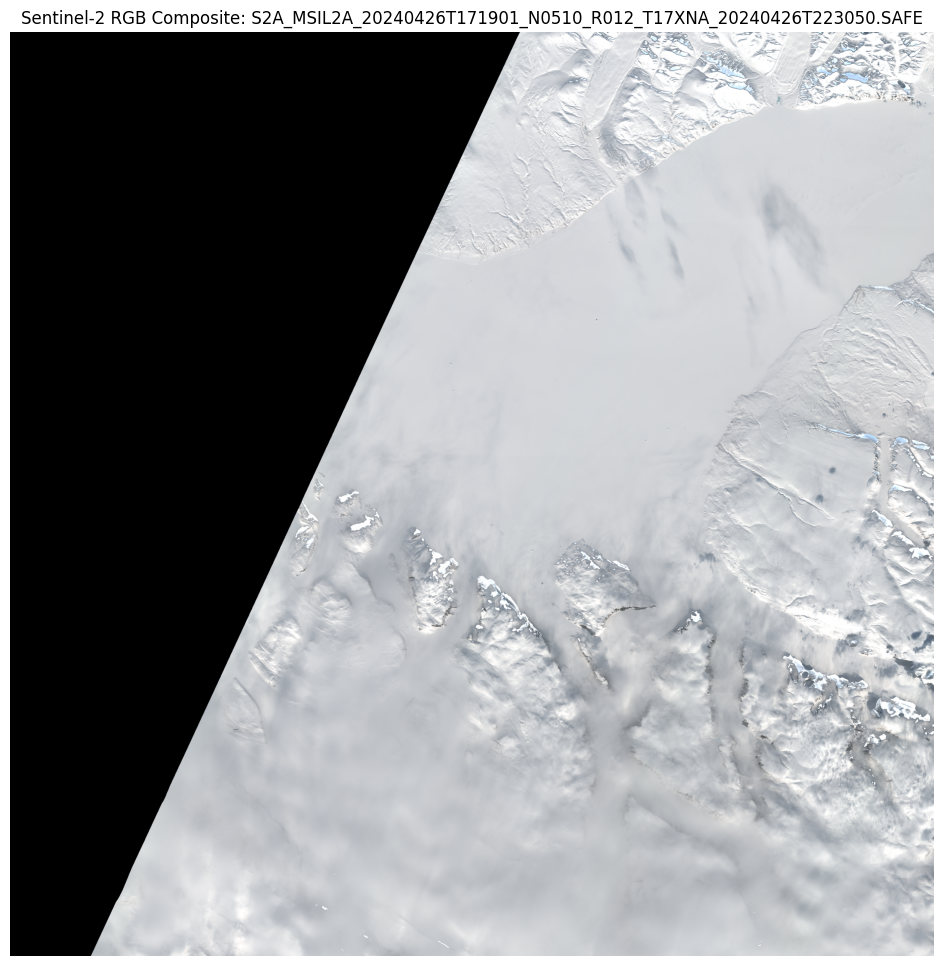

Processing file: S2A_MSIL2A_20240429T172901_N0510_R055_T17XNA_20240429T222851.SAFE


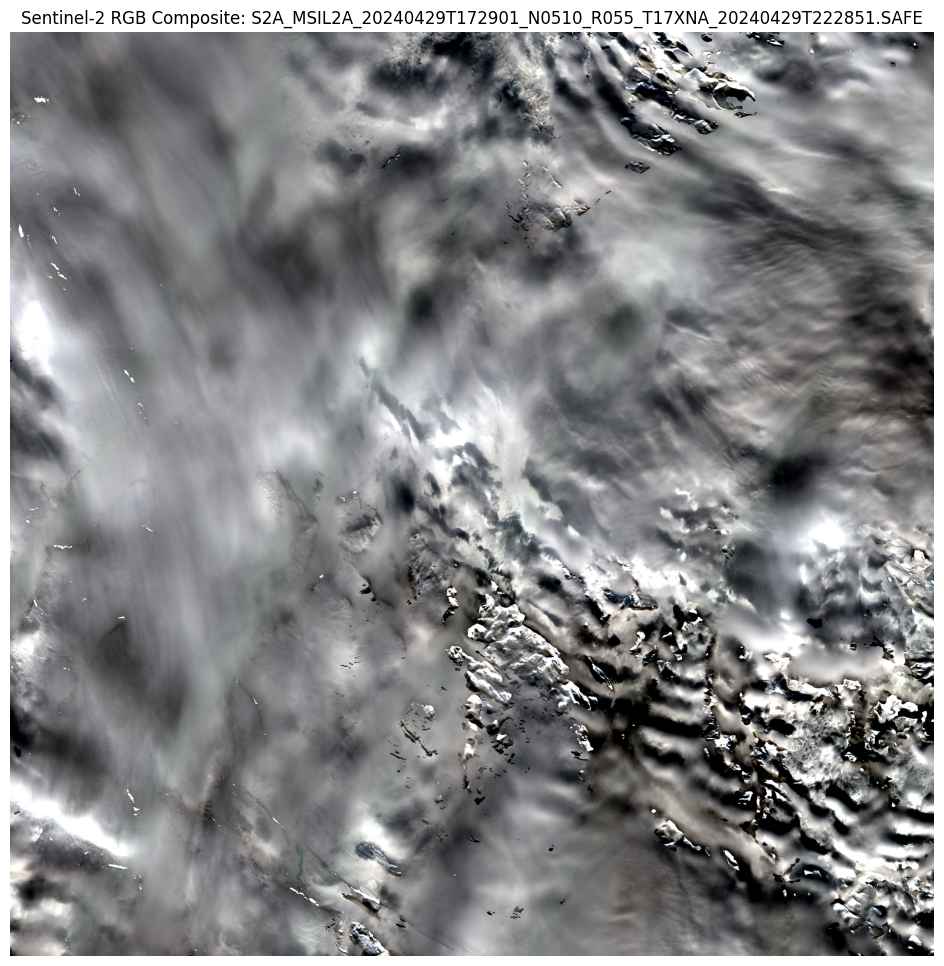

Processing file: S2B_MSIL2A_20240430T174909_N0510_R141_T17XNA_20240430T201515.SAFE


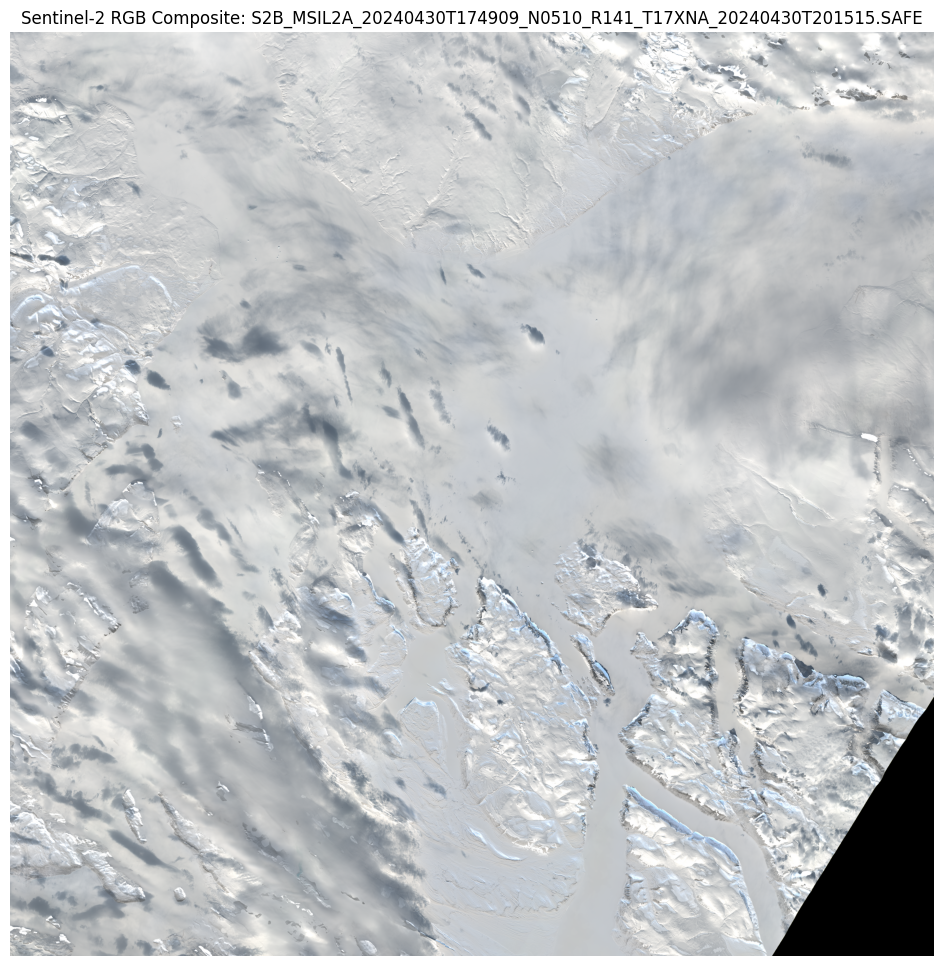

Processing file: S2A_MSIL2A_20240422T173911_N0510_R098_T17XNA_20240423T004122.SAFE


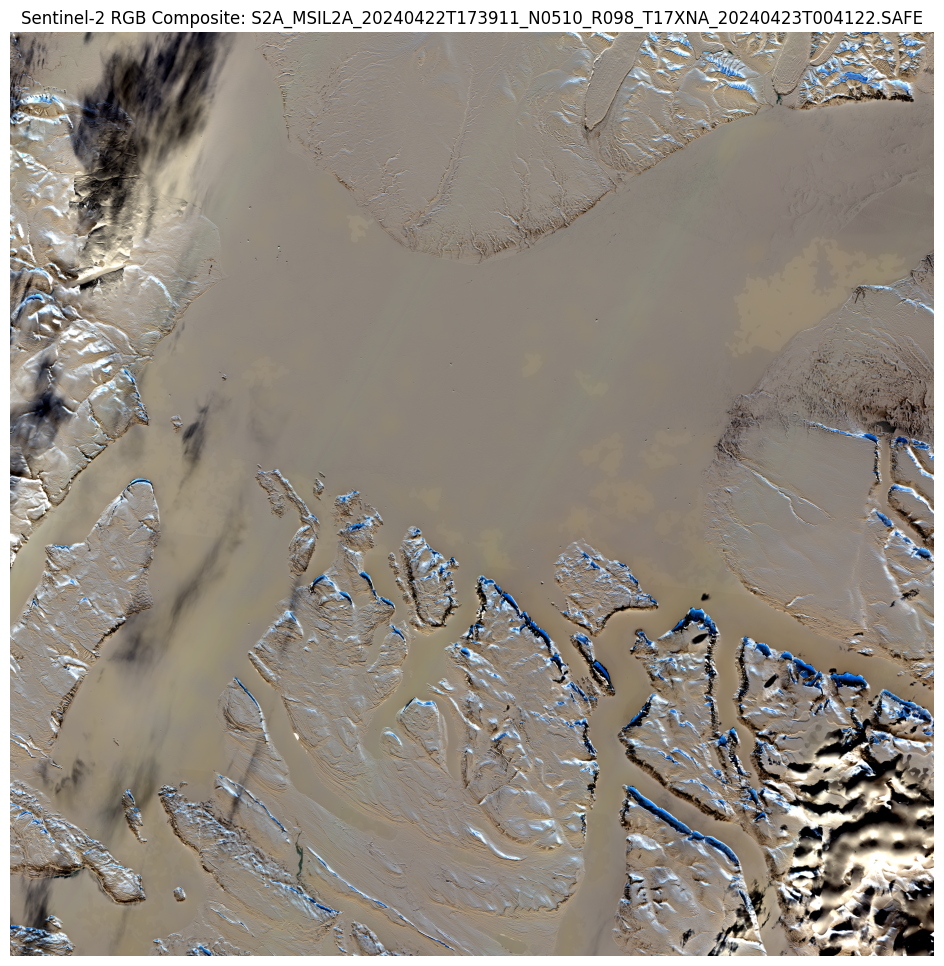

Processing file: S2A_MSIL2A_20240425T174911_N0510_R141_T17XNA_20240426T010852.SAFE


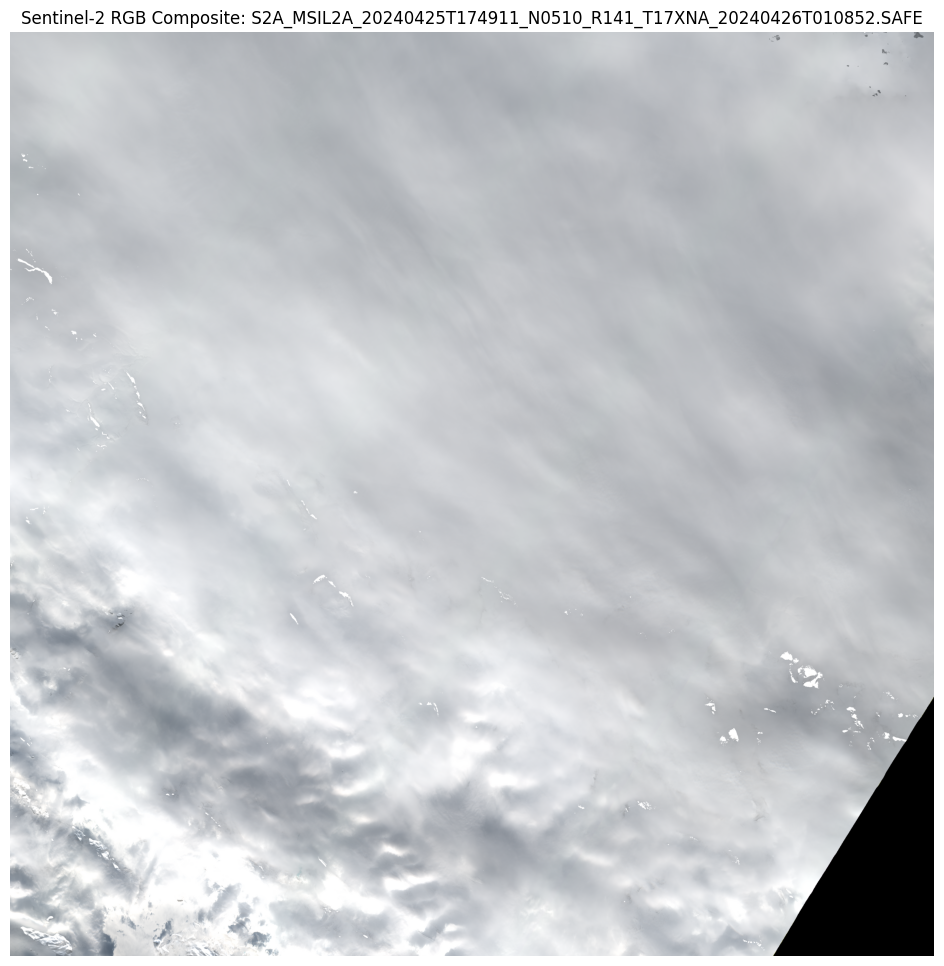

Processing file: S2B_MSIL2A_20240427T173859_N0510_R098_T17XNA_20240427T200733.SAFE


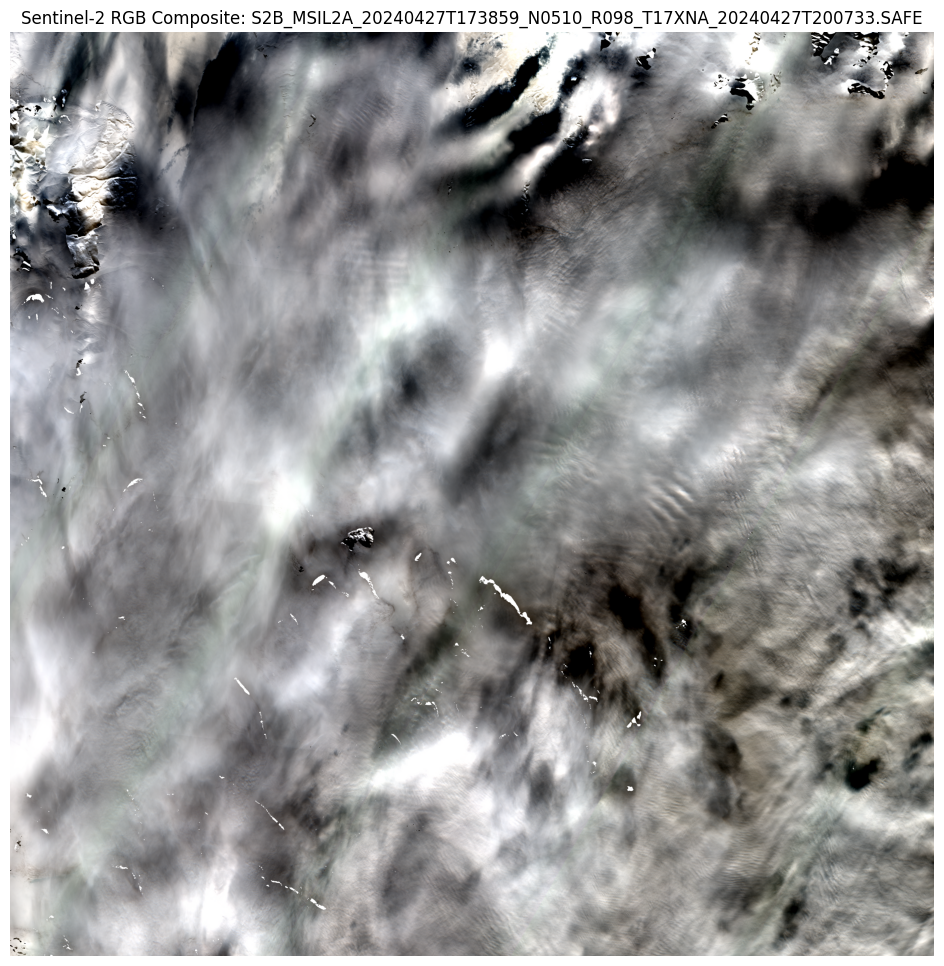

Processing file: S2B_MSIL2A_20240424T172859_N0510_R055_T17XNA_20240424T195611.SAFE


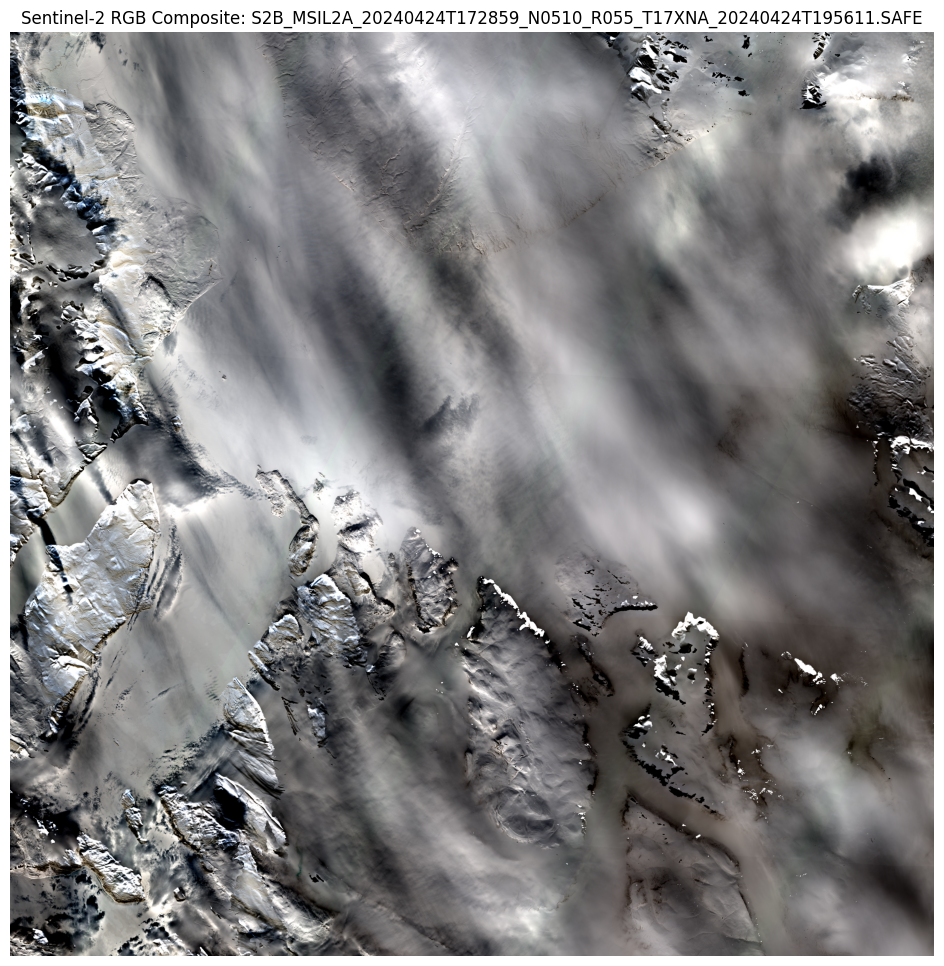

In [14]:
# See all 6 sentinel-2 images

import rasterio
import numpy as np
import matplotlib.pyplot as plt
import os
import zipfile

s2_downloads = "/cs/student/projects2/aisd/2024/tcannon/dissertation/Dissertation/master_model/sentinel_downloads"

for file in os.listdir(s2_downloads):
    # Unzip the SAFE files
    #if file.endswith(".zip"):
        #with zipfile.ZipFile(os.path.join(s2_downloads, file), 'r') as zip_ref:
            #zip_ref.extractall(s2_downloads)
            #print(f"Unzipped: {file}")
    if file.endswith(".tif") or file.endswith(".SAFE"):
        print(f"Processing file: {file}")
        # File path
        file_path = os.path.join(s2_downloads, file)

        # Sentinel-2 Level-2A stores bands in GRANULE/.../IMG_DATA/R10m for 10m bands
        granule_path = os.path.join(file_path, "GRANULE")
        granule_dir = [os.path.join(granule_path, d) for d in os.listdir(granule_path) if os.path.isdir(os.path.join(granule_path, d))][0]
        img_data_path = os.path.join(granule_dir, "IMG_DATA", "R10m")

        # Paths to 10m RGB bands
        band_paths = {
            "B04": [os.path.join(img_data_path, f) for f in os.listdir(img_data_path) if "B04_10m.jp2" in f][0],
            "B03": [os.path.join(img_data_path, f) for f in os.listdir(img_data_path) if "B03_10m.jp2" in f][0],
            "B02": [os.path.join(img_data_path, f) for f in os.listdir(img_data_path) if "B02_10m.jp2" in f][0],
        }

        # Load each band
        bands = {}
        for b, path in band_paths.items():
            with rasterio.open(path) as src:
                bands[b] = src.read(1).astype(np.float32)

        # Stack into RGB (B04=R, B03=G, B02=B)
        rgb = np.stack([bands["B04"], bands["B03"], bands["B02"]], axis=-1)

        # Normalize for display (percentile stretch)
        def normalize(img, lower=2, upper=98):
            """Percentile-based normalization"""
            img_norm = np.zeros_like(img)
            for i in range(3):
                p_low, p_high = np.percentile(img[..., i], (lower, upper))
                img_norm[..., i] = np.clip((img[..., i] - p_low) / (p_high - p_low), 0, 1)
            return img_norm

        rgb_norm = normalize(rgb)

        # Plot
        plt.figure(figsize=(12, 12))
        plt.imshow(rgb_norm)
        plt.title("Sentinel-2 RGB Composite: " + file)
        plt.axis("off")
        plt.show()
    

/tmp/ipykernel_258346/1149147016.py:67: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_cycle = plt.cm.get_cmap("tab20", 20)


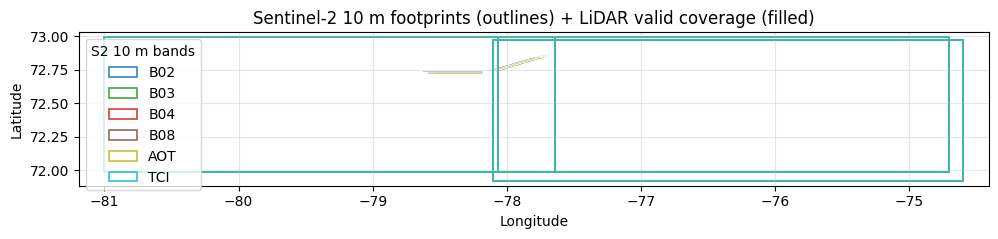

In [2]:
import os, glob
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import matplotlib.patches as mpatches

import rasterio
from rasterio.warp import calculate_default_transform, reproject, Resampling, transform_bounds
from affine import Affine

# --- CONFIG ---
S2_ROOT = "/cs/student/projects2/aisd/2024/tcannon/dissertation/Dissertation/master_model/sentinel_downloads"
LIDAR_DIR = "/cs/student/projects2/aisd/2024/tcannon/dissertation/data/tifs"
MAX_REPROJ_DIM = 2000  # cap size when reprojecting masks to WGS84 (for speed/memory)

S2_BAND_CODES = ["B02", "B03", "B04", "B08", "AOT", "TCI"]  # the 6 typical 10 m assets if present

def _rect_from_bounds(bounds_ll, **kwargs):
    minx, miny, maxx, maxy = bounds_ll
    return Rectangle((minx, miny), maxx - minx, maxy - miny, **kwargs)

def plot_s2_10m_footprints(ax, s2_root):
    band_colors = {
        "B02": "C0", "B03": "C2", "B04": "C3", "B08": "C5", "AOT": "C8", "TCI": "C9"
    }
    label_done = set()
    all_bounds = []

    # Find .SAFE products (any depth)
    safe_dirs = sorted(glob.glob(os.path.join(s2_root, "**", "*.SAFE"), recursive=True))
    for safe in safe_dirs:
        # Granule subdir varies slightly across versions
        jp2_glob = os.path.join(safe, "GRANULE", "*", "IMG_DATA", "R10m", "*.jp2")
        jp2s = glob.glob(jp2_glob)
        if not jp2s:
            continue

        for band in S2_BAND_CODES:
            band_files = [p for p in jp2s if f"_{band}_" in os.path.basename(p)]
            for f in band_files:
                try:
                    with rasterio.open(f) as ds:
                        b_ll = transform_bounds(ds.crs, "EPSG:4326", *ds.bounds, densify_pts=21)
                except Exception:
                    continue
                rect = _rect_from_bounds(
                    b_ll, fill=False, lw=1.2,
                    edgecolor=band_colors.get(band, "k"),
                    alpha=0.9, linestyle="-"
                )
                ax.add_patch(rect)
                if band not in label_done:
                    rect.set_label(band)
                    label_done.add(band)
                all_bounds.append(b_ll)

    return all_bounds

def _extent_from_affine(transform: Affine, width: int, height: int):
    left, top = transform * (0, 0)
    right, bottom = transform * (width, height)
    # Note: in north-up images, transform.e is negative, so 'bottom' < 'top' is OK
    return (left, right, bottom, top)

def overlay_lidar_valid_regions(ax, lidar_dir, max_dim=MAX_REPROJ_DIM):
    cmap_cycle = plt.cm.get_cmap("tab20", 20)
    legends = []
    all_bounds = []

    tif_paths = sorted(glob.glob(os.path.join(lidar_dir, "**", "*.tif"), recursive=True))
    for i, fp in enumerate(tif_paths):
        try:
            with rasterio.open(fp) as ds:
                # read first band; if multi-band and nodata differs, tweak as needed
                arr = ds.read(1, masked=False)
                nodata = ds.nodata if ds.nodata is not None else -9999
                valid = (arr != nodata).astype(np.uint8)

                # reproject valid mask to WGS84
                dst_crs = "EPSG:4326"
                dst_transform, dst_w, dst_h = calculate_default_transform(
                    ds.crs, dst_crs, ds.width, ds.height, *ds.bounds
                )
                # downscale if huge
                scale = 1.0
                max_wh = max(dst_w, dst_h)
                if max_wh > max_dim:
                    scale = max_dim / max_wh
                    dst_w = max(1, int(dst_w * scale))
                    dst_h = max(1, int(dst_h * scale))
                    dst_transform = Affine(dst_transform.a/scale, dst_transform.b, dst_transform.c,
                                           dst_transform.d, dst_transform.e/scale, dst_transform.f)

                out = np.zeros((dst_h, dst_w), dtype=np.uint8)
                reproject(
                    source=valid,
                    destination=out,
                    src_transform=ds.transform,
                    src_crs=ds.crs,
                    dst_transform=dst_transform,
                    dst_crs=dst_crs,
                    resampling=Resampling.nearest,
                    src_nodata=0,
                    dst_nodata=0,
                )

                # build extent and plot transparent single-color mask
                extent = _extent_from_affine(dst_transform, dst_w, dst_h)
                color = list(cmap_cycle(i % 20))
                color[3] = 0.35  # alpha
                # build a 2-entry cmap: 0 -> fully transparent, 1 -> chosen color
                from matplotlib.colors import ListedColormap
                cmap = ListedColormap([(0,0,0,0), tuple(color)])

                ax.imshow(
                    np.ma.masked_where(out == 0, out),
                    extent=extent, origin="upper", interpolation="nearest",
                    cmap=cmap, vmin=0, vmax=1
                )

                # legend entry
                legends.append(mpatches.Patch(color=color, label=Path(fp).name))
                # store overall bounds for later autoscale
                all_bounds.append(transform_bounds(ds.crs, "EPSG:4326", *ds.bounds, densify_pts=21))

        except Exception as e:
            print(f"[warn] Skipping {fp}: {e}")
            continue

    if legends:
        ax.legend(handles=legends, loc="upper left", bbox_to_anchor=(1.02, 1), title="LiDAR TIFFs")
    return all_bounds

def autoscale_from_bounds(ax, bounds_list, pad_frac=0.03):
    if not bounds_list:
        return
    mins = np.array([[b[0], b[1]] for b in bounds_list])  # (minx, miny)
    maxs = np.array([[b[2], b[3]] for b in bounds_list])  # (maxx, maxy)
    minx, miny = mins.min(axis=0)
    maxx, maxy = maxs.max(axis=0)
    dx, dy = maxx - minx, maxy - miny
    ax.set_xlim(minx - dx*pad_frac, maxx + dx*pad_frac)
    ax.set_ylim(miny - dy*pad_frac, maxy + dy*pad_frac)

def main():
    fig, ax = plt.subplots(figsize=(10, 8))

    # 1) S2 band footprints (outlines)
    s2_bounds = plot_s2_10m_footprints(ax, S2_ROOT)

    # 2) LiDAR valid areas (filled where value != -9999 or file nodata)
    lidar_bounds = overlay_lidar_valid_regions(ax, LIDAR_DIR)

    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    ax.set_title("Sentinel-2 10 m footprints (outlines) + LiDAR valid coverage (filled)")
    ax.grid(True, alpha=0.3)

    # put S2 legend separately (bands)
    ax.legend(loc="upper left", title="S2 10 m bands")

    # 3) autoscale to include *everything*
    autoscale_from_bounds(ax, s2_bounds + lidar_bounds)

    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    main()


In [12]:
# Convert the Sentinel-2 product to a tif file

import os
import rasterio
from rasterio.shutil import copy as rio_copy
import numpy as np
import glob

s2_dir = "/cs/student/projects2/aisd/2024/tcannon/dissertation/Dissertation/master_model/sentinel_downloads"
output_dir = "/cs/student/projects2/aisd/2024/tcannon/dissertation/data/s2_tifs"

# Create output directory if it doesn't exist
os.makedirs(output_dir, exist_ok=True)

for file in os.listdir(s2_dir):
    if file.endswith(".SAFE"):
        print(f"Processing: {file}")
        
        # Use glob to find all JP2 files in the SAFE structure
        jp2_pattern = os.path.join(s2_dir, file, "GRANULE", "*", "IMG_DATA", "R10m", "*.jp2")
        jp2_files = glob.glob(jp2_pattern)
        
        if not jp2_files:
            print(f"  No JP2 files found in {file}")
            continue
        
        # Process each JP2 file
        for jp2_path in jp2_files:
            # Create output filename: ProductName_BandName.tif
            jp2_filename = os.path.basename(jp2_path)
            tif_filename = jp2_filename.replace(".jp2", ".tif")
            tif_path = os.path.join(output_dir, tif_filename)
            
            try:
                with rasterio.open(jp2_path) as src:
                    rio_copy(src, tif_path, driver="GTiff")
                print(f"  Converted: {jp2_filename} -> {tif_filename}")
            except Exception as e:
                print(f"  Error converting {jp2_filename}: {e}")

Processing: S2A_MSIL2A_20240422T173911_N0510_R098_T17XNA_20240423T004122.SAFE
  Converted: T17XNA_20240422T173911_AOT_10m.jp2 -> T17XNA_20240422T173911_AOT_10m.tif
  Converted: T17XNA_20240422T173911_B02_10m.jp2 -> T17XNA_20240422T173911_B02_10m.tif
  Converted: T17XNA_20240422T173911_B03_10m.jp2 -> T17XNA_20240422T173911_B03_10m.tif
  Converted: T17XNA_20240422T173911_B04_10m.jp2 -> T17XNA_20240422T173911_B04_10m.tif
  Converted: T17XNA_20240422T173911_B08_10m.jp2 -> T17XNA_20240422T173911_B08_10m.tif
  Converted: T17XNA_20240422T173911_TCI_10m.jp2 -> T17XNA_20240422T173911_TCI_10m.tif
  Converted: T17XNA_20240422T173911_WVP_10m.jp2 -> T17XNA_20240422T173911_WVP_10m.tif
Processing: S2A_MSIL2A_20240502T173911_N0510_R098_T18XVF_20240502T232553.SAFE
  Converted: T18XVF_20240502T173911_AOT_10m.jp2 -> T18XVF_20240502T173911_AOT_10m.tif
  Converted: T18XVF_20240502T173911_B02_10m.jp2 -> T18XVF_20240502T173911_B02_10m.tif
  Converted: T18XVF_20240502T173911_B03_10m.jp2 -> T18XVF_20240502T173

# Data Exploration

Min LiDAR value: -0.44536957144737244
Max LiDAR value: 3.3873047828674316


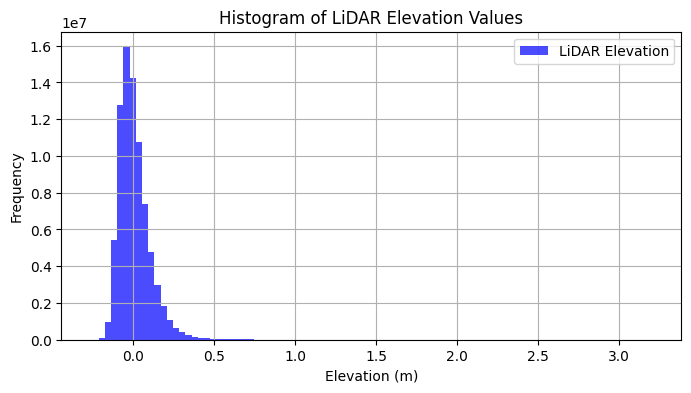

Mean LiDAR value: 0.006983673200011253


In [2]:
# Plot the distribution of the LiDAR values

# Path to your directory
lidar_dir = "/cs/student/projects2/aisd/2024/tcannon/dissertation/data/tifs"
patch_size = 256 # LiDAR patch size in pixels (1m resolution)

def merge_lidar_files(lidar_files):
    src_files_to_mosaic = [rasterio.open(fp) for fp in lidar_files]
    mosaic, mosaic_transform = merge(src_files_to_mosaic)
    lidar_meta = src_files_to_mosaic[0].meta.copy()
    lidar_meta.update({
        "height": mosaic.shape[1],
        "width": mosaic.shape[2],
        "transform": mosaic_transform
    })
    for src in src_files_to_mosaic:
        src.close()
    return mosaic[0], mosaic_transform, lidar_meta

# Mosaic LIDAR files
lidar_files = glob(os.path.join(lidar_dir, "*1m.tif"))
lidar_array, lidar_transform, lidar_meta = merge_lidar_files(lidar_files)

# Replace -9999 with NaN
lidar_array = np.where(lidar_array == -9999, np.nan, lidar_array)

# Get min and max LiDAR values
lidar_min = np.nanmin(lidar_array)
lidar_max = np.nanmax(lidar_array)
print(f"Min LiDAR value: {lidar_min}")
print(f"Max LiDAR value: {lidar_max}")

# Get histogram of Lidar values
plt.figure(figsize=(8, 4))
plt.hist(lidar_array[~np.isnan(lidar_array)].flatten(), bins=100,
            color='blue', alpha=0.7, label='LiDAR Elevation')
plt.title("Histogram of LiDAR Elevation Values")
plt.xlabel("Elevation (m)")
plt.ylabel("Frequency")
plt.xlim(lidar_min, lidar_max)
plt.legend()
plt.grid()
plt.show()

# Print mean
lidar_mean = np.nanmean(lidar_array)
print(f"Mean LiDAR value: {lidar_mean}")

In [4]:
# Get a symmetric range which covers 99.5% of the data
lower_bound = np.nanpercentile(lidar_array, 0.25)
upper_bound = np.nanpercentile(lidar_array, 99.75)
print(f"Lower bound (0.25%): {lower_bound}")
print(f"Upper bound (99.75%): {upper_bound}")

# print min, max, and mean
print(f"Min LiDAR value: {lidar_min}")
print(f"Max LiDAR value: {lidar_max}")
print(f"Mean LiDAR value: {lidar_mean}")

Lower bound (0.25%): -0.16531983017921448
Upper bound (99.75%): 0.5227751731872559
Min LiDAR value: -0.44536957144737244
Max LiDAR value: 3.3873047828674316
Mean LiDAR value: 0.006983673200011253


Downsampled shape: (317, 620)


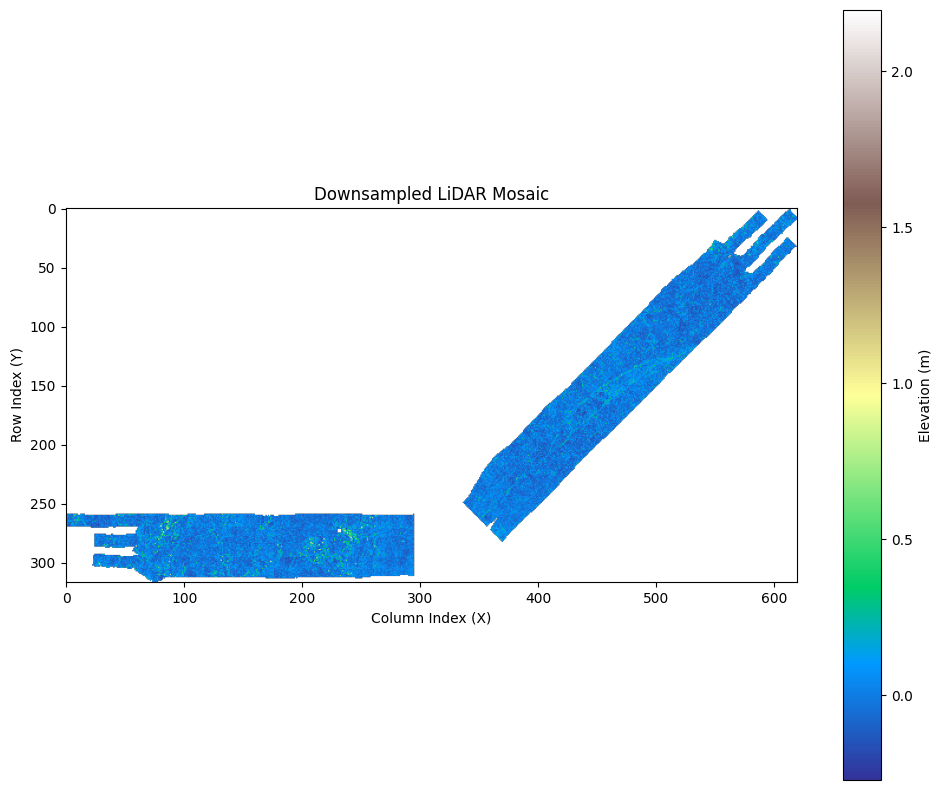

In [5]:
# Split LiDAR regions

def plot_lidar_mosaic(lidar_array, title="LiDAR Mosaic", vmin=None, vmax=None):
    """
    Plot the LiDAR mean elevation mosaic with axis labels and a colorbar.

    Parameters:
    - lidar_array: np.ndarray of shape (H, W) 
    - title: plot title
    - vmin, vmax: value range for color normalization (optional)
    """

    lidar_array = np.where(np.isnan(lidar_array), np.nan, lidar_array)

    plt.figure(figsize=(10, 8))
    im = plt.imshow(lidar_array, cmap="terrain", vmin=vmin, vmax=vmax)
    plt.colorbar(im, label="Elevation (m)")
    plt.title(title)
    plt.xlabel("Column Index (X)")
    plt.ylabel("Row Index (Y)")
    plt.grid(False)
    plt.tight_layout()
    plt.show()

# Plot the LiDAR mosaic
# Downsample for visualization (e.g., every 50th pixel)
downsample_factor = 50
lidar_small = lidar_array[::downsample_factor, ::downsample_factor]

print("Downsampled shape:", lidar_small.shape)
plot_lidar_mosaic(lidar_small, title="Downsampled LiDAR Mosaic")
#plot_lidar_mosaic(lidar_array, title="LiDAR Mean Elevation Mosaic", vmin=0, vmax=0.8)
#plot_lidar_mosaic(lidar_array[:, 1250:1500, 0:1500])
#plot_lidar_mosaic(lidar_array[:, 0:1500, 160:3200])